In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy import io
import scvelo as scv

sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

# set random seed for reproducibility:
np.random.seed(42)


In [2]:
sc.__version__

'1.8.1'

In [3]:
# set working dir 
os.chdir('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Gerrits_2021/')

fig_dir = 'figures/'
data_dir = 'data/'


## Load Gerrits AD 2021 datasets

In [ ]:
count_data_dir = '/dfs3b/swaruplab/shared_lab/cross-disorder/count_matrices/AD_Gerrits_2021/'
samples = [s for s in os.listdir(count_data_dir)]
adata_list = []
for sample in samples:
    try:
        adata = sc.read_h5ad('{}{}/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(count_data_dir, sample))
    except:
        print('sample', sample, ' error')
        continue
    adata.obs['Sample'] = sample
    adata.obs['Study'] = 'Gerrits_2021'
    adata.obs['orig_barcode'] = adata.obs.index

    adata_list.append(adata)

    print(sample, adata.layers['spliced'].shape)


In [4]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index

# filter small cells
sc.pp.filter_cells(adata, min_counts = 250)

# add counts layer
adata.layers["counts"] = adata.X.copy()

# print shape of dataset
adata.shape


(496644, 36601)

In [5]:
# load meta-data from SRA:

sample_meta = pd.read_csv(
    '/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/AD_Gerrits/SRR_raw.txt',
    sep=','
)
sample_meta = sample_meta[['Run', 'age', 'Region', 'braak/abc_score', 'clinical_diagnosis', 'gender', 'RIN', 'Sample Name', 'Tissue']]
sample_meta = sample_meta.rename(
    {'Run':'Sample', 
     'clinical_diagnosis': 'Diagnosis',
     'gender': 'Sex',
    }, axis=1)

temp = adata.obs.merge(
    sample_meta,
    how = 'left',
    left_on = 'Sample',
    right_on = 'Sample'
)
temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None


In [6]:
len(adata.obs.Sample.unique())

36

In [7]:
adata.obs.Diagnosis.value_counts().sum()

496644

In [8]:
# save unfiltered dataset:
adata.write_h5ad('{}Gerrits_2021_unfiltered.h5ad'.format(data_dir))


... storing 'orig_barcode' as categorical
... storing 'Sample' as categorical
... storing 'Study' as categorical
... storing 'Region' as categorical
... storing 'braak/abc_score' as categorical
... storing 'Diagnosis' as categorical
... storing 'Sex' as categorical
... storing 'Sample Name' as categorical
... storing 'Tissue' as categorical


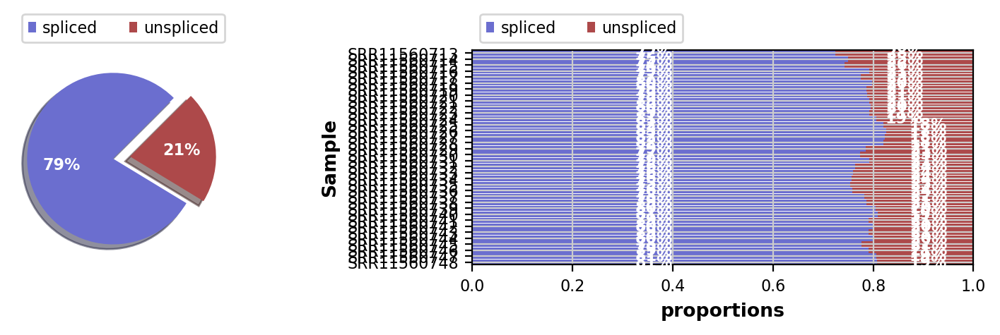

In [9]:
import scvelo as scv
scv.pl.proportions(adata, groupby='Sample')

## Quality Control Filtering

In [4]:
# load unfiltered data 
adata = sc.read_h5ad('{}Gerrits_2021_unfiltered.h5ad'.format(data_dir))
adata

AnnData object with n_obs × n_vars = 496644 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'age', 'Region', 'braak/abc_score', 'Diagnosis', 'Sex', 'RIN', 'Sample Name', 'Tissue'
    var: 'gene_ids'
    layers: 'counts', 'spliced', 'unspliced'

In [5]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=True, inplace=True)

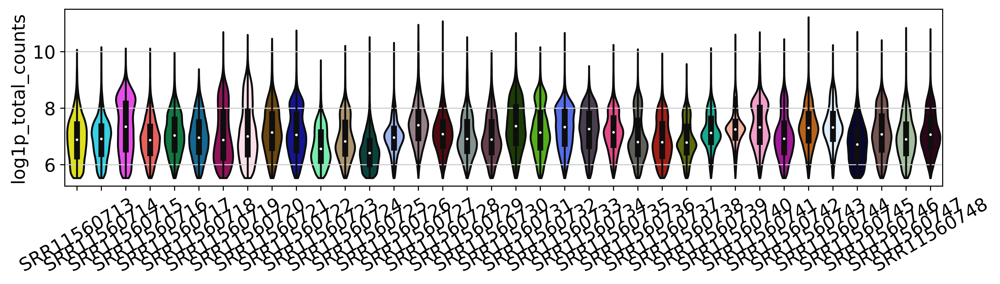

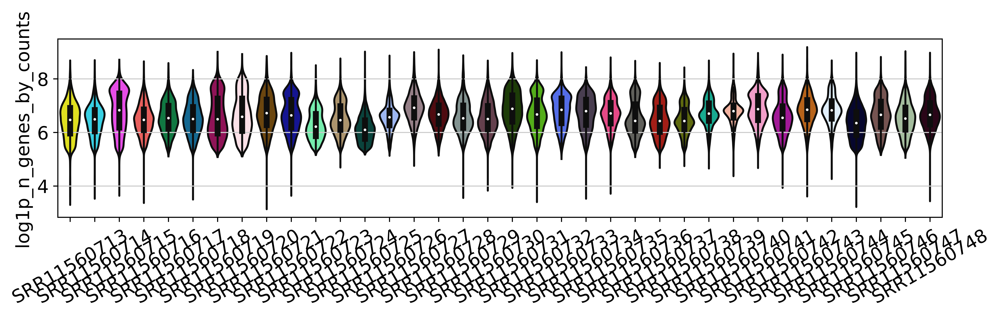

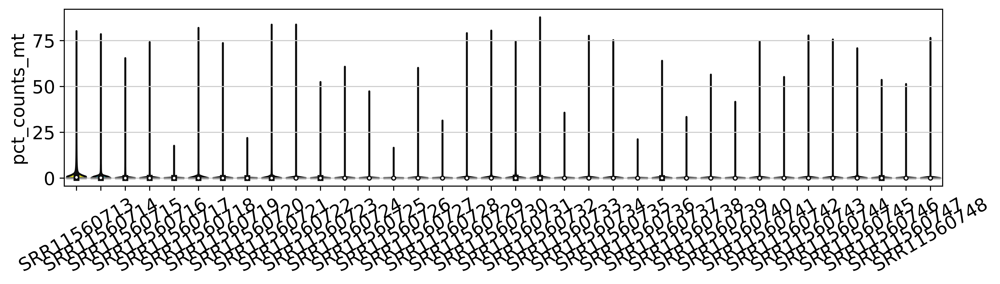

In [6]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [7]:

mt_quantile = 0.95 
umi_quantile = 0.95
doublet_quantile = 0.95

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

SRR11560740 removed  2652 , kept  16776
SRR11560739 removed  2574 , kept  16280
SRR11560738 removed  2344 , kept  14882
SRR11560748 removed  2355 , kept  14686
SRR11560724 removed  2298 , kept  14593
SRR11560729 removed  2262 , kept  14486
SRR11560726 removed  2202 , kept  14504
SRR11560741 removed  2130 , kept  14484
SRR11560730 removed  2269 , kept  14248
SRR11560737 removed  2200 , kept  13675
SRR11560744 removed  2188 , kept  13597
SRR11560743 removed  2097 , kept  13667
SRR11560735 removed  2067 , kept  13459
SRR11560723 removed  2038 , kept  13242
SRR11560736 removed  2131 , kept  13020
SRR11560734 removed  2066 , kept  12856
SRR11560727 removed  1974 , kept  12732
SRR11560742 removed  1874 , kept  12180
SRR11560732 removed  1931 , kept  12010
SRR11560728 removed  1876 , kept  12035
SRR11560746 removed  1899 , kept  11961
SRR11560716 removed  1822 , kept  11400
SRR11560747 removed  1790 , kept  11230
SRR11560714 removed  1724 , kept  10830
SRR11560725 removed  1733 , kept  10616


In [8]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)].copy()
adata

AnnData object with n_obs × n_vars = 428829 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'age', 'Region', 'braak/abc_score', 'Diagnosis', 'Sex', 'RIN', 'Sample Name', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'Sample_colors'
    layers: 'counts', 'spliced', 'unspliced'

In [9]:
adata = adata[adata.obs.n_genes_by_counts >= 250].copy()
adata = adata[adata.obs.pct_counts_mt <= 10].copy()

adata.shape

(414794, 36601)

## Process data:

In [10]:
# preserve the counts in its own layer
adata.layers['counts'] = adata.X

In [11]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(
    adata, 
    min_mean=0.0125, 
    max_mean=3, 
    min_disp=0.5,
    
)

In [12]:
# regress_out gets killed for taking too much mem
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=8)
sc.pp.scale(adata, max_value=10)


In [ ]:
sc.tl.pca(adata, svd_solver='arpack')

In [ ]:

# key must be a string/cat for this to work!!
sc.external.pp.harmony_integrate(adata, key = 'Sample')

In [ ]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [ ]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [ ]:
sc.tl.leiden(adata, resolution=1)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

... storing 'cell_type' as categorical
... storing 'annotation' as categorical


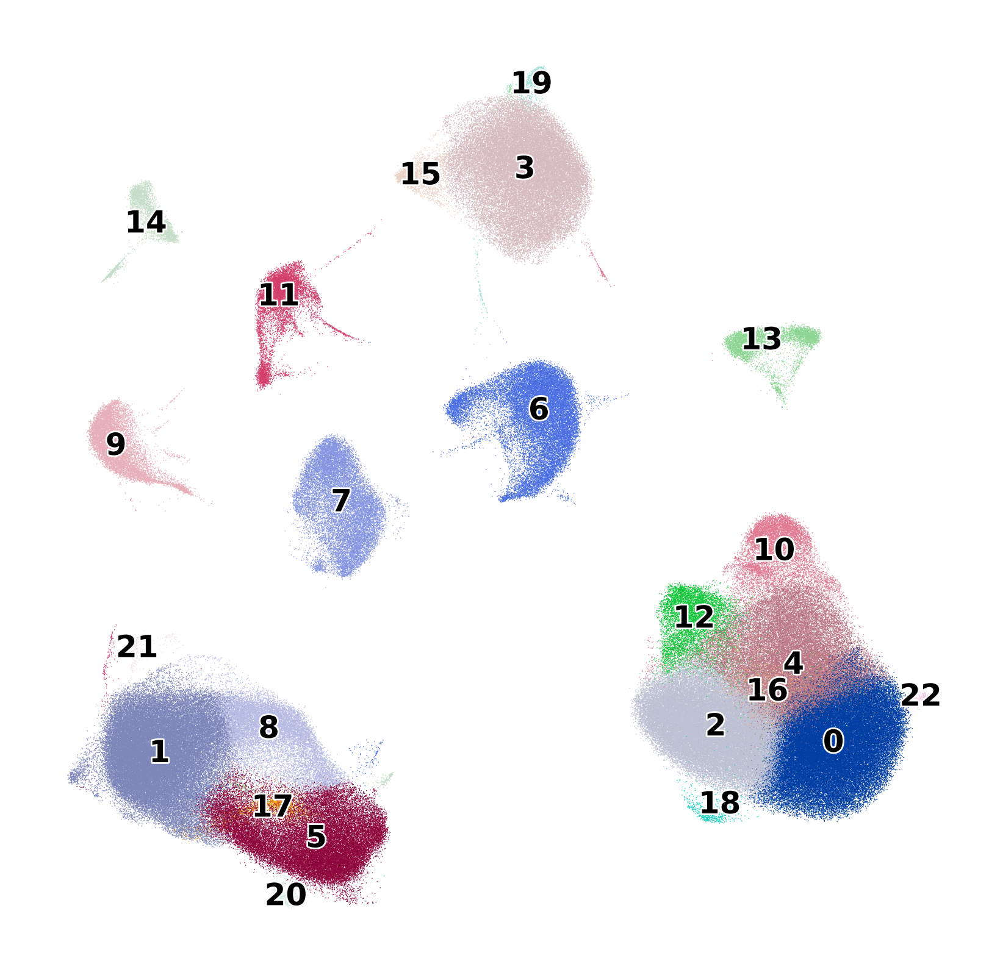

In [22]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


categories: 0, 1, 2, etc.
var_group_labels: Oligodendrocyte, Astrocyte, Microglia, etc.


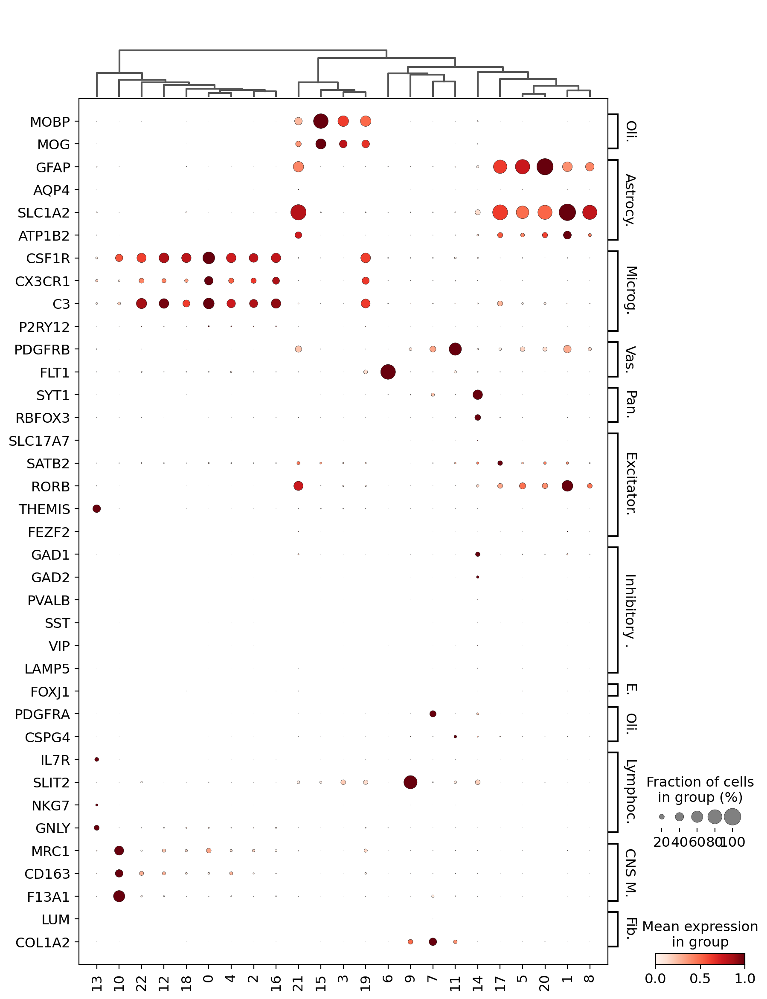

In [23]:

# get 2-3 more markers for each glia type... for example aqp4 is totally gone here!!
# this paper doesn't have much neurons!!
# Use the marker genes from the Gerrits et al paper


marker_dict = {
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Astrocyte': ['GFAP', 'AQP4', 'SLC1A2', 'ATP1B2'],
    'Microglia': ['CSF1R', 'CX3CR1', 'C3', 'P2RY12'],
    'Vasculature': ['PDGFRB', 'FLT1'], # PER, END
    'Pan-neuronal': ['SYT1', 'RBFOX3'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2', 'RORB', 'THEMIS', 'FEZF2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2', 'PVALB', 'SST', 'VIP', 'LAMP5'],
    'Ependyma' : ['FOXJ1'], # not expressed
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4'],
    'Lymphocytes': ['IL7R', 'SLIT2', 'NKG7','GNLY'],
    'CNS Macro': ['MRC1', 'CD163', 'F13A1'],
    'Fibroblast': ['LUM', 'COL1A2']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=True, 
    standard_scale='var', swap_axes=True
)


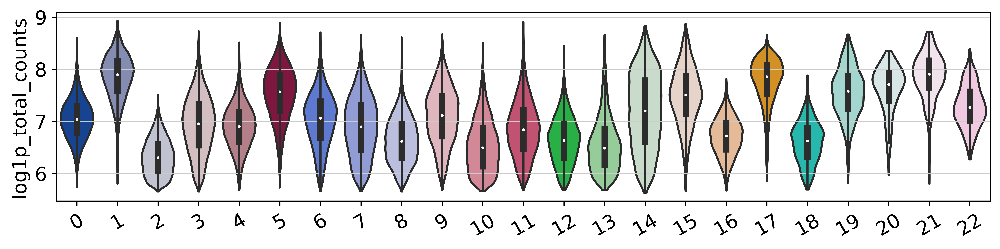

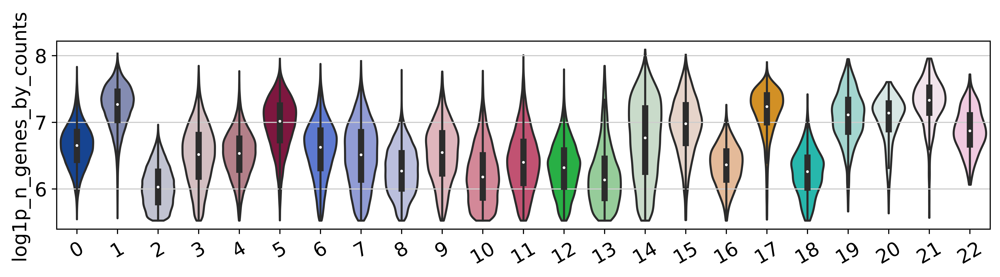

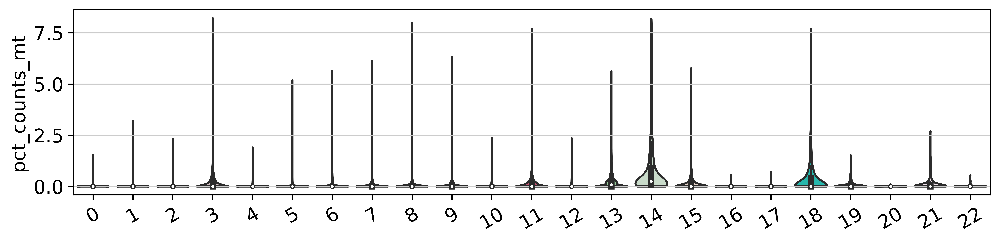

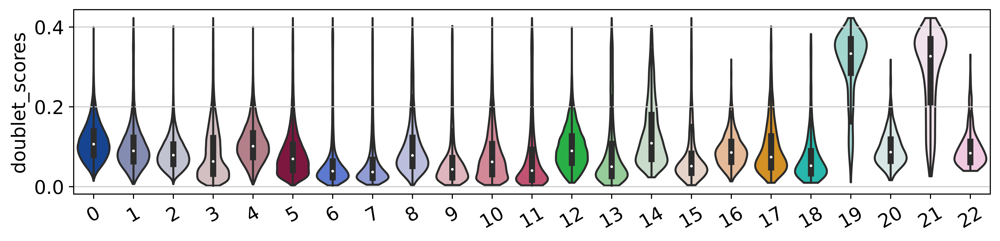

In [24]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

## Annotate clusters:

In [28]:
adata.obs.annotation.value_counts()

MG2        95670
MG1        65449
ASC1       61323
ODC1       43629
ASC2       34420
END        23801
OPC        17284
ASC3       15557
FBR        10413
MAC        10066
PER         9568
MG3         8290
LYM         5759
ASC4        4421
ODC2        2453
MG4         2013
ASC5        1639
Doublet     1132
MG5          906
ASC6         770
MG6          231
Name: annotation, dtype: int64

In [26]:

# load cluster anno df 
anno_df = pd.read_csv('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Gerrits_2021/data/Gerrits_2021_leiden_clusters.csv')

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')

adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata.obs['annotation'] = temp['annotation'].astype(str).to_list()



In [62]:
# remove unknown & doublet clusters:
clusters_to_remove = ['Doublet']
adata = adata[~adata.obs.annotation.isin(clusters_to_remove)].copy()


MemoryError: Unable to allocate 56.4 GiB for an array with shape (413662, 36601) and data type float32

In [29]:
# write anndata:
adata.write_h5ad('{}/Gerrits_2021_processed.h5ad'.format(data_dir))

In [ ]:
adata

In [36]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation.pdf'
)


Trying to set attribute `.obs` of view, copying.


MemoryError: Unable to allocate 56.4 GiB for an array with shape (413662, 36601) and data type float32

## Save processed dataset:

In [54]:
# write obs table 
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]
adata.obs.to_csv('{}/Gerrits_2021_processed_obs.csv'.format(data_dir))

# write var table:
adata.var.to_csv('{}/Gerrits_2021_processed_var.csv'.format(data_dir))

In [55]:
# write anndata:
adata.write_h5ad('{}/Gerrits_2021_processed.h5ad'.format(data_dir))

In [56]:
# save the sparse matrix for Seurat:
X = adata.layers['counts']
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}/Gerrits_2021_counts.mtx'.format(data_dir), X)

In [57]:
# save the Harmony Matrix for Seurat:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}/Gerrits_2021_processed_harmony.csv'.format(data_dir))
